## References:
- Original paper: https://arxiv.org/pdf/1501.00092.pdf
- Reference codes: https://github.com/MarkPrecursor/SRCNN-keras , https://github.com/kunal-visoulia/Image-Restoration-using-SRCNN
Note: Look at the reference code pages to see what is different from the original implementation

In [1]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import SGD, Adam
from skimage.metrics import structural_similarity as ssim
import cv2
import numpy as np
import math 
import os
from matplotlib import pyplot as plt

In [2]:
def prepare_images(path, factor):
    
    # loop through the files in the directory
    for file in os.listdir(path):
        
        # open the file
        img = cv2.imread(path + '/' + file)
        
        # find old and new image dimensions
        h, w, c = img.shape
        new_height = int(h / factor)
        new_width = int(w / factor)
        
        # resize the image - down
        img = cv2.resize(img, (new_width, new_height), interpolation = cv2.INTER_LINEAR) #interploation are methods for resizing images;how do you go from image with 100px to 1000px 
        #bilinear interpolation
        
        # resize the image - up
        img = cv2.resize(img, (w, h), interpolation = cv2.INTER_LINEAR)
        
        # save the image
        print('Saving {}'.format(file))
        cv2.imwrite('images/{}'.format(file), img)

In [3]:
prepare_images('./Set14',2)
# degrading the images

Saving foreman.bmp
Saving man.bmp
Saving pepper.bmp
Saving comic.bmp
Saving coastguard.bmp
Saving baboon.bmp
Saving monarch.bmp
Saving flowers.bmp
Saving face.bmp
Saving ppt3.bmp
Saving zebra.bmp
Saving bridge.bmp
Saving barbara.bmp
Saving lenna.bmp


In [4]:
def psnr(target,ref):#target image and refernce image
    
    #assume RGB image and convert all integer values to float
    target_data=target.astype(float)
    ref_data=ref.astype(float)
    
    diff=ref_data-target_data
    diff=diff.flatten('C')#need ot flatten so computations can be done
    
    rmse=math.sqrt(np.mean(diff**2.))#2. for float values
    
    return 20*math.log10(255./rmse)

def mse(target,ref):
    # the MSE between the two images is the sum of the squared difference between the two images
    err=np.sum((target.astype('float')-ref.astype('float'))**2)
    err=err/float(target.shape[0]*target.shape[1])#divided by total number of pixels
    
    return err

def compare_images(target,ref):
    scores=[]
    scores.append(psnr(target,ref))
    scores.append(mse(target,ref))
    scores.append(ssim(target,ref, channel_axis=2))#multichannel so that it can handle 3Dor 3 channel images RGB/BGR 
    
    return scores
# define necessary image processing functions

#necessary cuz when we run images through SRCNN based on the kernel sizes and convulational layers, we are going to lose some of these outside pixels
#the images are going to get smaller and that's why it is neccesary to have a divisible image size 
def modcrop(img,scale):
    #temp size
    tmpsz=img.shape
    sz=tmpsz[0:2]
    
    #ensures that dimension of our image are divisible by scale(doesn't leaves hanging remainders) by cropping the images size
    #np.mod returns the remainder bewtween our sz and scale
    sz=sz-np.mod(sz,scale)
    
    img=img[0:sz[0],1:sz[1]]
    return img

#crop offs the bordersize from all sides of the image
def shave(image,border):
    img=image[border: -border,border:-border]
    return img

In [5]:
def model():
    SRCNN = Sequential(
        [
            Input(((None, None, 1))),
            Conv2D(filters=128, kernel_size=(9,9), activation="relu", padding="valid"),
            Conv2D(filters=64, kernel_size=(3,3), activation="relu", padding="same"),
            Conv2D(filters=1, kernel_size=(5,5), activation="linear", padding="valid"),
        ]
    )
    # SRCNN.summary()
    
    adam = Adam(learning_rate=0.0003) #different from paper
    SRCNN.compile(optimizer=adam, loss="mean_squared_error", metrics=['mean_squared_error'])
    
    return SRCNN

In [6]:
#define main prediction function

def predict(image_path, source = "./Set14"):
    
    #load the srcnn model with weights cuz deep learning neural n/w take lot of time to train(have to feed in large amount of input data)
    srcnn=model()
    srcnn.load_weights('3051crop_weight_200.h5')
     
    #load the degraded and reference images
    #in opencv, images are loaded as BGR channels
    path,file=os.path.split(image_path)
    degraded=cv2.imread(image_path)
    ref=cv2.imread(source+'/{}'.format(file))
    #preprocess the image with modcrop
    ref=modcrop(ref,3)#when calculating our image quality metrics later we have the same size image to what we produce in SRCNN network
    degraded=modcrop(degraded,3)
    
    #convert the image to YCrCb(3 channel image) - (srcnn trained on Y channel)
    temp=cv2.cvtColor(degraded,cv2.COLOR_BGR2YCrCb)
    #opencv does a very good job in converting from rgb to YCrCb and back
    
    #create image slice and normalize cuz SRCNN works on one dimensional input(or 3D inputs of depth 1 ,ie, inputs with one channel)
    Y=np.zeros((1,temp.shape[0],temp.shape[1],1),dtype=float)
    #create a numpy array the we fill with data,temp.shape[0]=width,[1]=height and last one means one channel(essentially like batch=1 cuz that's what going to get passed to the n/w ')
    #fill in the data; all values are normalized to between 0 and 1 as that's how srcnn was trained
    Y[0,:,:,0]=temp[:,:,0].astype(float)/255
    #first 0 means 0th index(we are saying that batch size is 1); :,: means every point in these channels; last 0 means first channel,ie, all the pixels in first luminescence channel
    #so we have our image slice, we have the Y channel, which is the first channel(index 0) out of the image that we converted to YCrCb color space
    
    #perform super-resolution with srcnn
    pre=srcnn.predict(Y,batch_size=1, verbose=0)#that's why we had index 0  above cuz we are saying that batch size is 1
    
    #post-process output cuz pre is still normalized
    pre*=255#multiplying every pixel by 255
    pre[pre[:]>255]=255#any pixels >255 set it =255 to prevent any rounding errors due to multiplication
    pre[pre[:]<0] =0# same reason as above
    pre=pre.astype(np.uint8)#convert float back to int values
    
    #cuz this is only the luminescence channel in the pre ,SO
    #copy Y channel back to image and convert to BGR
    temp=shave(temp,6)#accd.to tutor it loses 3 pixels on each side so if we shave this with a border 6,we can crop it appropriately there, so it is the same size as our output
    #if not agree with tutor, use print statements to see the specific dimensions
    
    # for the first channel(Y channel), copy in the output of our network
    temp[:,:,0]=pre[0,:,:,0]
    #So we are keeping the red difference and blue difference, channels 1 and 2, in this temp image which is in the YCrCb color space
    #and in the first one we are copying in our ouput,our luminiscence channel
    
    #convert back to bgr
    output=cv2.cvtColor(temp,cv2.COLOR_YCrCb2BGR)
    
    #emove borderfrom reference and degraded image, so that all our images(ref,degraded(low res.), and ouput(high res.)) are of the same size
    ref = shave(ref.astype(np.uint8), 6)
    degraded = shave(degraded.astype(np.uint8), 6)
    
    # image quality calculations
    scores = []
    scores.append(compare_images(degraded, ref))#degraded wrt ref
    scores.append(compare_images(output, ref))#high res. output wrt ref
    
    # return images and scores
    return ref, degraded, output, scores

Metal device set to: Apple M2

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



2023-05-18 11:49:27.319345: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Degraded Image: 
PSNR: 27.248686459559124
MSE: 367.56400047398984
SSIM: 0.8690622024599293

Reconstructed Image: 
PSNR: 29.660202196004384
MSE: 210.95090650551012
SSIM: 0.8989099208870149



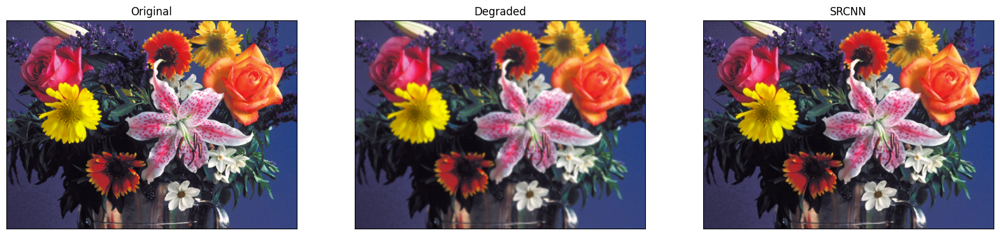

In [7]:
ref,degraded,output,scores=predict('images/flowers.bmp')
# print all scores for all images
print('Degraded Image: \nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[0][0], scores[0][1], scores[0][2]))
print('Reconstructed Image: \nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[1][0], scores[1][1], scores[1][2]))


# display images as subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 8))#1 row,3 columns
axs[0].imshow(cv2.cvtColor(ref, cv2.COLOR_BGR2RGB))#first subplot
#imshow assumes RGB images but cv2 loads images as BGR else channel mixing will take place and we will get weird images
axs[0].set_title('Original')
axs[1].imshow(cv2.cvtColor(degraded, cv2.COLOR_BGR2RGB))#2nd subplot
axs[1].set_title('Degraded')
axs[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
axs[2].set_title('SRCNN')

# remove the x and y ticks
for ax in axs:
    ax.set_xticks([])#leave them blank to remove ticks
    ax.set_yticks([])

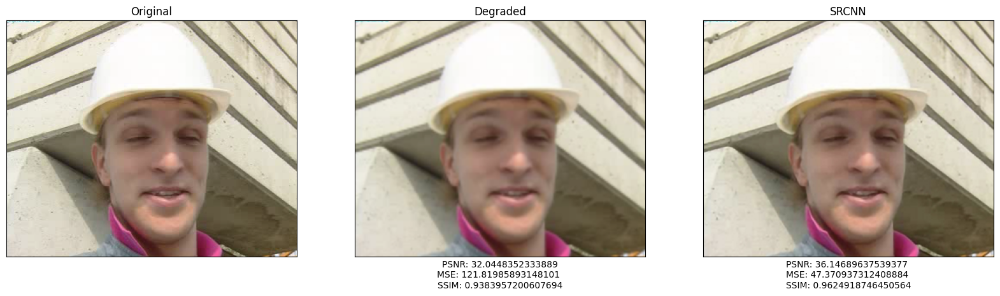

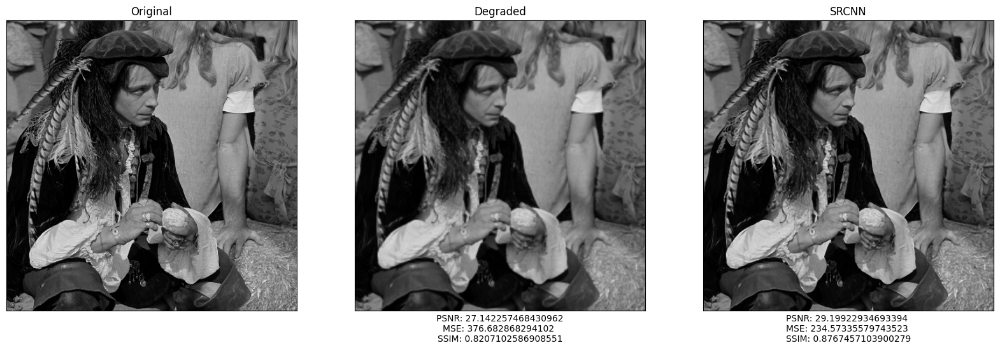

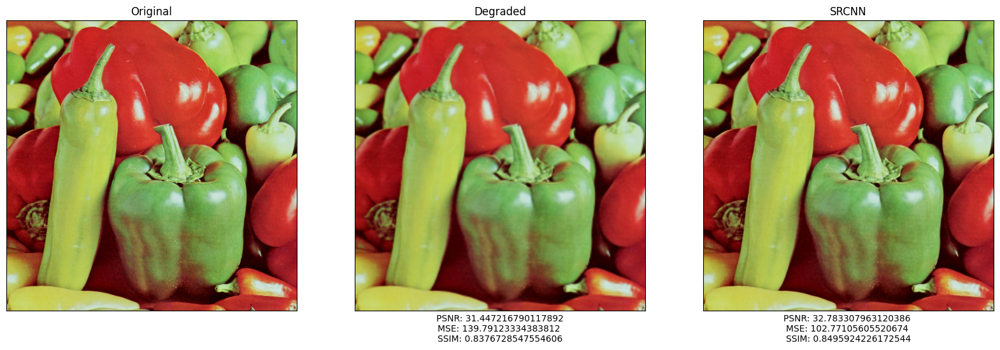

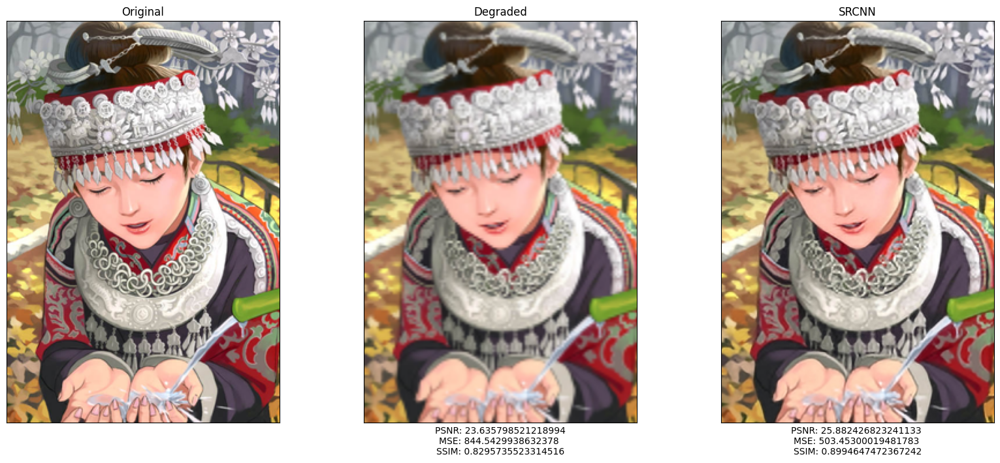

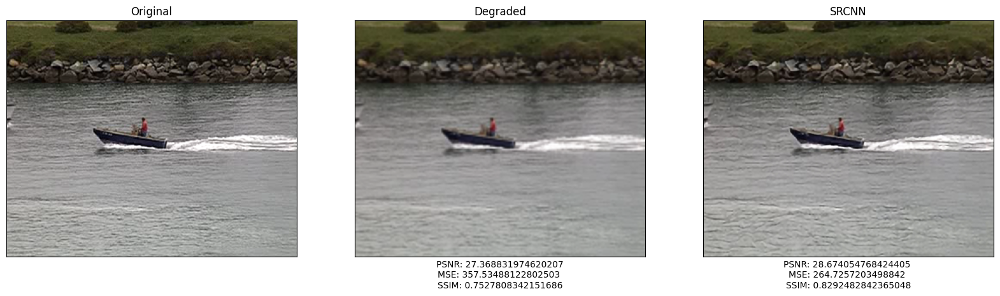

...

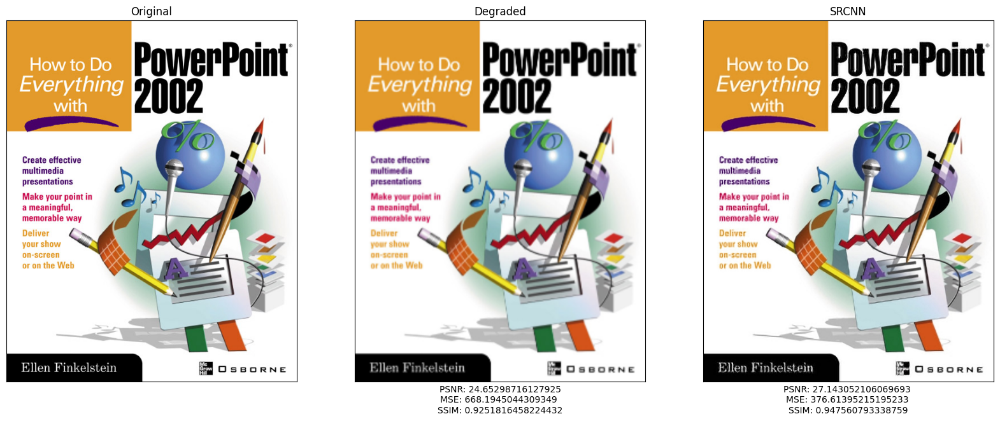

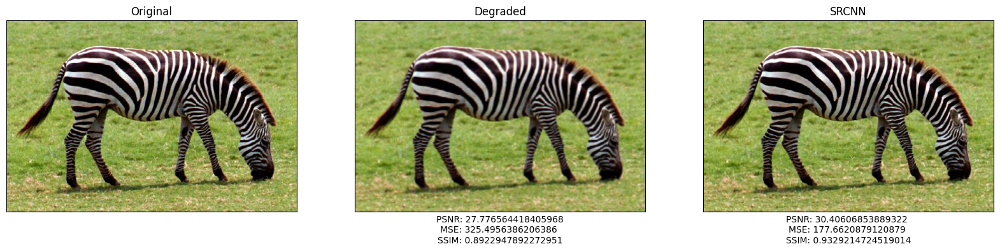

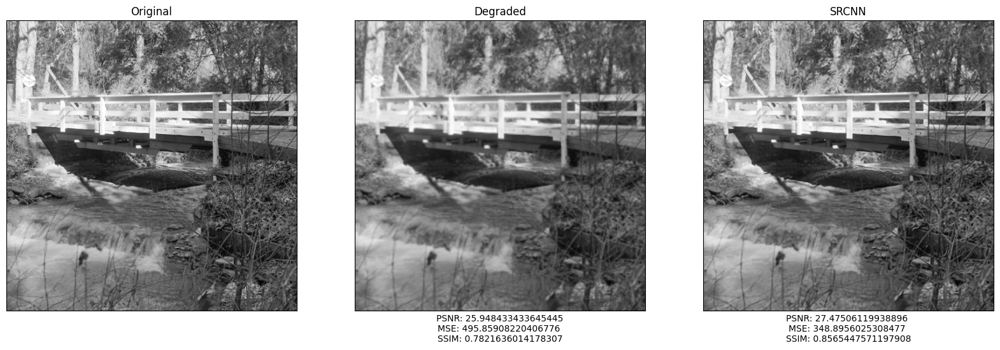

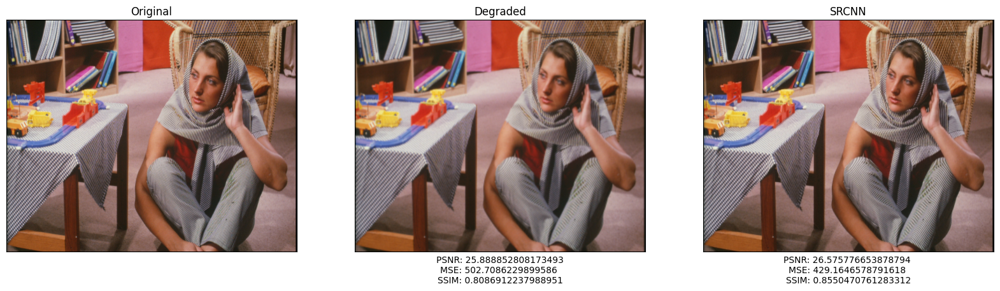

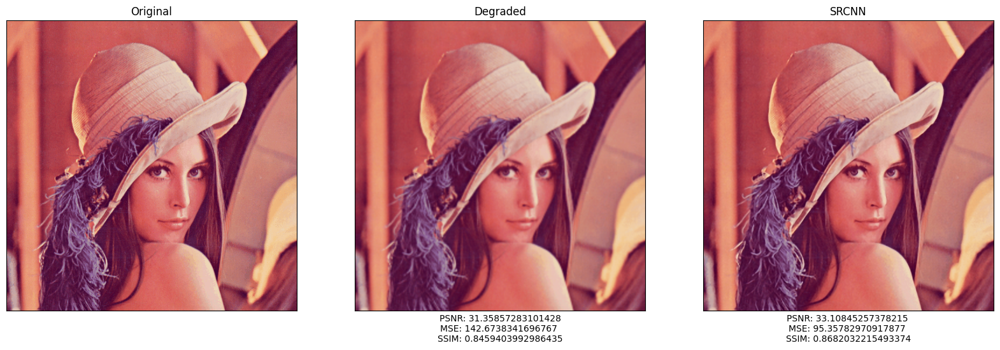

In [8]:
for file in os.listdir('images'):
    
    # perform super-resolution
    ref, degraded, output, scores = predict('images/{}'.format(file))
    
    # display images as subplots
    fig, axs = plt.subplots(1, 3, figsize=(20, 8))
    axs[0].imshow(cv2.cvtColor(ref, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original')
    axs[1].imshow(cv2.cvtColor(degraded, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Degraded')
    axs[1].set(xlabel = 'PSNR: {}\nMSE: {} \nSSIM: {}'.format(scores[0][0], scores[0][1], scores[0][2]))
    axs[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    axs[2].set_title('SRCNN')
    axs[2].set(xlabel = 'PSNR: {} \nMSE: {} \nSSIM: {}'.format(scores[1][0], scores[1][1], scores[1][2]))

    # remove the x and y ticks
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])
      
#     print('Saving {}'.format(file))
#     fig.savefig('output/{}.png'.format(os.path.splitext(file)[0])) 
#     plt.close()

SRCNN uses bicubic interpolated images as input and returns a reconstruction of the images improving the metrics of the images. The visual appeals of the images are good enough when the upsampling rate is 2. Increasing the upsampling rate degrades the performace of SRCNN drastically, even though the metrics are still better than the vanilla bicubic interpolation. 